In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from chemevo import evolution as evo
import astropy
from astropy.table import Table
from astropy.io import fits
import seaborn as sns
from matplotlib.animation import PillowWriter

params = {
   'axes.labelsize': 15,
   'font.size': 15,
   'legend.fontsize': 14,
   'xtick.minor.visible': True,
   'ytick.minor.visible': True,
   'xtick.labelsize': 15,
   'ytick.labelsize': 15,
   'text.usetex': True, #to use TeX in your labels
   'font.family':'serif',
   'axes.titlesize': 15,
   'xtick.direction': 'in',
   'ytick.direction': 'in',
   'xtick.top': True,
   'ytick.right': True,
   'xtick.major.size': 6,
   'xtick.minor.size': 3,
   'ytick.major.size': 6,
   'ytick.minor.size': 3
   }
rcParams.update(params)

colors = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7", "#F0E442"]
linestyles = ['-', '--', ':', '-.']

In [2]:
import pandas as pd
from astropy.io import fits
from astropy.table import Table

def decode(df):
    """
    Decode DataFrame with byte strings into ordinary strings.
    """
    str_df = df.select_dtypes([object])
    str_df = str_df.stack().str.decode('utf-8').unstack()
    for col in str_df:
        df[col] = str_df[col]
    return df

def fitsrec_to_pandas(fits_rec):
    """
    Convert a FITS_rec object (from astropy.io.fits) to a pandas DataFrame.
    """
    # Convert FITS_rec to astropy Table first
    table = Table(fits_rec)
    
    # Filter out multidimensional columns
    cols = [name for name in table.colnames if len(table[name].shape) <= 1]
    
    # Convert to pandas DataFrame
    df = table[cols].to_pandas()
    
    # Decode byte strings
    df = decode(df)
    
    return df

def compute_binned_median(df, x_col, y_col, n_bins=12):
    """
    Bin df[x_col] into n_bins, then compute median of df[y_col] in each bin,
    and also return the number of points in each bin.

    Returns columns:
    ['x_bin', f'{y_col}_median', 'x_center', 'count']
    """
    
    # Create bins
    x_bins = np.linspace(df[x_col].min(), df[x_col].max(), n_bins + 1)

    # Bin using pd.cut
    x_bin_labels = pd.cut(df[x_col], bins=x_bins, include_lowest=True)

    # Group by bins and compute median AND count
    grouped = df.groupby(x_bin_labels).agg(
        y_median=(y_col, 'median'),
        count=(y_col, 'size')
    ).reset_index()

    # Add x_center using bin midpoint
    grouped['x_center'] = grouped[x_col].apply(lambda interval: interval.mid)

    # Rename bin column
    grouped = grouped.rename(columns={x_col: 'x_bin', 'y_median': f"{y_col}_median"})

    return grouped


In [3]:
with fits.open('../../data/astroNN_2proc_crossmatch.fits') as hdul:
    astronn_data = hdul[1].data
    twoprocess_data = hdul[2].data

highalpha = pd.read_csv("../highalpha.csv")
lowalpha = pd.read_csv("../lowalpha.csv")

data = fitsrec_to_pandas(astronn_data)

data['MN_O'] = data['MN_H'] - data['O_H']
data['FE_O'] = data['FE_H'] - data['O_H']
data['MN_MG'] = data['MN_H'] - data['MG_H']
data['FE_MG'] = data['FE_H'] - data['MG_H']
data['MG_FE'] = data['MG_H'] - data['FE_H']

pos_FE_H = data[(data['FE_H'] > 0)]
neg_FE_H = data[(data['FE_H'] < 0)]
data_high_alpha = pd.concat([pos_FE_H[(pos_FE_H['MG_FE'] > 0.12)], neg_FE_H[neg_FE_H['MG_FE'] > 0.12 - 0.13 * neg_FE_H['FE_H']]])
data_low_alpha = pd.concat([pos_FE_H[(pos_FE_H['MG_FE'] < 0.12)], neg_FE_H[neg_FE_H['MG_FE'] < 0.12 - 0.13 * neg_FE_H['FE_H']]])

# Create FE_H range arrays
feh_neg = np.linspace(data['FE_H'].min(), 0, 300)  # negative metallicity
feh_pos = np.linspace(0, data['FE_H'].max(), 300)  # positive metallicity

# Compute boundary line
mgfe_neg = 0.12 - 0.13 * feh_neg        # sloped part
mgfe_pos = np.full_like(feh_pos, 0.12)  # flat part at +0.12
feh_line = np.concatenate([feh_neg, feh_pos])
mgfe_line = np.concatenate([mgfe_neg, mgfe_pos])
mgh_line = mgfe_line + feh_line
femg_line = feh_line - mgh_line

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_5892/3137802370.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(x_bin_labels).agg(
/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_5892/3137802370.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(x_bin_labels).agg(
/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_5892/3137802370.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the fut

(-1.05, 0.55)

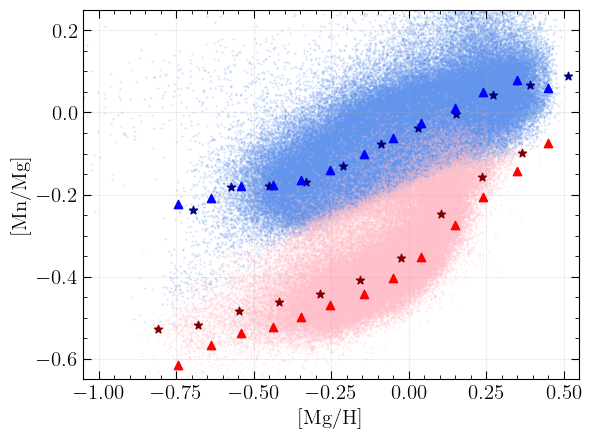

In [4]:
data_low_alpha = data_low_alpha[(data_low_alpha['galz'] < 2) & (data_low_alpha['galz'] > -2) &
                                (data_low_alpha['galr'] < 15) & (data_low_alpha['galr'] > 3)]

data_high_alpha = data_high_alpha[(data_high_alpha['galz'] < 2) & (data_high_alpha['galz'] > -2) &
                                (data_high_alpha['galr'] < 15) & (data_high_alpha['galr'] > 3)]

mnmg_high = compute_binned_median(data_high_alpha, x_col='MG_H', y_col='MN_MG', n_bins=20)
mnmg_low = compute_binned_median(data_low_alpha, x_col='MG_H', y_col='MN_MG', n_bins=20)
femg_high = compute_binned_median(data_high_alpha, x_col='MG_H', y_col='FE_MG', n_bins=20)
femg_low = compute_binned_median(data_low_alpha, x_col='MG_H', y_col='FE_MG', n_bins=20)

mnmg_high = mnmg_high[mnmg_high['count'] >= 100]
mnmg_low  = mnmg_low[mnmg_low['count']  >= 100]
femg_high = femg_high[femg_high['count'] >= 100]
femg_low  = femg_low[femg_low['count']  >= 100]


plt.scatter(data_low_alpha['MG_H'], data_low_alpha['MN_MG'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
plt.scatter(data_high_alpha['MG_H'], data_high_alpha['MN_MG'], alpha = 0.2, color = 'pink', s = 0.5)
plt.scatter(mnmg_low['x_center'], mnmg_low['MN_MG_median'], marker='*', color = 'navy')

plt.scatter(highalpha['[Mg/H]'], highalpha['[Mn/Mg]'], marker='^', color = 'red', zorder=5)
plt.scatter(lowalpha['[Mg/H]'], lowalpha['[Mn/Mg]'], marker='^', color = 'blue', zorder=6)
plt.scatter(mnmg_high['x_center'], mnmg_high['MN_MG_median'], marker='*', color = 'maroon')

plt.grid('True', alpha = 0.2)

plt.ylim(-0.65,0.25)
plt.xlabel('[Mg/H]')
plt.ylabel('[Mn/Mg]')
plt.xlim(-1.05,0.55)

In [5]:
data_low_alpha_org = data_low_alpha
data_high_alpha_org = data_high_alpha

N = 10000

def downsample(df, N):
    if len(df) > N:
        return df.sample(N, random_state=42)   # random subset of N
    else:
        return df
down_sample_flag = 0
if down_sample_flag == 1:
    data_low_alpha = downsample(data_low_alpha, N)
    data_high_alpha = downsample(data_high_alpha, N)

print(len(data_high_alpha_org))
print(len(data_low_alpha_org))

print(len(data_high_alpha))

68308
191737
68308


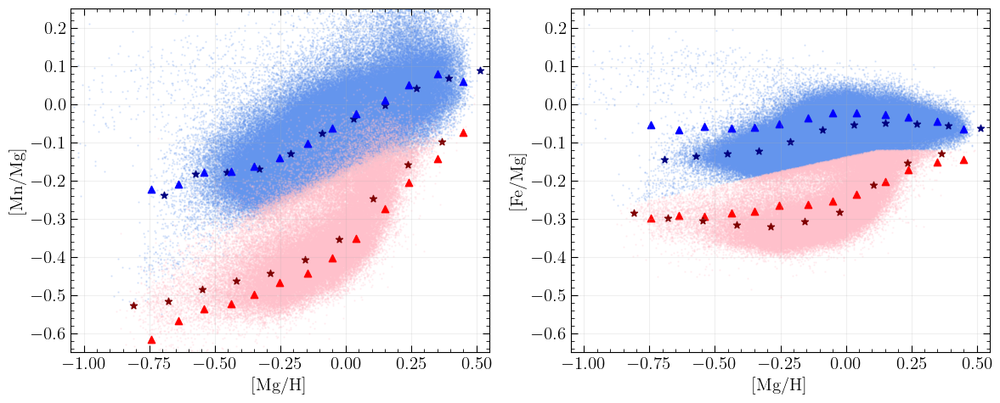

In [6]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.scatter(data_low_alpha['MG_H'], data_low_alpha['MN_MG'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
plt.scatter(data_high_alpha['MG_H'], data_high_alpha['MN_MG'], alpha = 0.2, color = 'pink', s = 0.5)

plt.scatter(highalpha['[Mg/H]'], highalpha['[Mn/Mg]'], marker='^', color = 'red', zorder=5)
plt.scatter(lowalpha['[Mg/H]'], lowalpha['[Mn/Mg]'], marker='^', color = 'blue', zorder=6)

plt.scatter(mnmg_low['x_center'], mnmg_low['MN_MG_median'], marker='*', color = 'navy')
plt.scatter(mnmg_high['x_center'], mnmg_high['MN_MG_median'], marker='*', color = 'maroon')

plt.grid('True', alpha = 0.2)

plt.ylim(-0.65,0.25)
plt.xlabel('[Mg/H]')
plt.ylabel('[Mn/Mg]')
plt.xlim(-1.05,0.55)


plt.subplot(1,2,2)
plt.scatter(data_low_alpha['MG_H'], data_low_alpha['FE_MG'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
plt.scatter(data_high_alpha['MG_H'], data_high_alpha['FE_MG'], alpha = 0.2, color = 'pink', s = 0.5)

plt.scatter(highalpha['[Mg/H]'], highalpha['[Fe/Mg]'], marker='^', color = 'red')
plt.scatter(lowalpha['[Mg/H]'], lowalpha['[Fe/Mg]'], marker='^', color = 'blue')

plt.scatter(femg_low['x_center'], femg_low['FE_MG_median'], marker='*', color = 'navy')
plt.scatter(femg_high['x_center'], femg_high['FE_MG_median'], marker='*', color = 'maroon')

plt.grid('True', alpha = 0.2)
plt.xlabel('[Mg/H]')
plt.ylabel('[Fe/Mg]')
plt.ylim(-0.65,0.25)
plt.xlim(-1.05,0.55)
plt.tight_layout()

# SFRS

In [7]:
def make_mock_pop(galaxy_model, sfr, n_samples=1000, error_on_met = 0.025):
    mstars = sfr/galaxy_model.tau_star_arr[0] * dt
    cdf_mstars = np.cumsum(mstars)/np.sum(mstars)
    u = np.random.rand(n_samples)
    sampled = np.searchsorted(cdf_mstars, u)
    gal_df = pd.DataFrame(columns=['O_H', 'Fe_O', 'Mn_O', 'O_Fe', 'Fe_H'])
    gal_df['O_H'] = np.random.normal(loc=galaxy_model.O_H[sampled], scale = error_on_met, size=n_samples)
    gal_df['Fe_O'] = np.random.normal(loc=galaxy_model.Fe_O[sampled], scale = error_on_met, size=n_samples)
    gal_df['Mn_O'] = np.random.normal(loc=galaxy_model.Mn_O[sampled], scale = error_on_met, size=n_samples)
    gal_df['O_Fe'] = np.random.normal(loc=galaxy_model.O_Fe[sampled], scale = error_on_met, size=n_samples)
    gal_df['Fe_H'] = np.random.normal(loc=galaxy_model.Fe_H[sampled], scale = error_on_met, size=n_samples)

    return gal_df

In [8]:
def rise_fall(t, tau_1, tau_2):
    return 1 * (1 - np.exp(-t/tau_1)) * np.exp(-t/tau_2)

t_array = np.linspace(0.0001,14,int(1e3))
dt = t_array[1] - t_array[0]
print("dt = ", dt)

dt =  0.014013913913913914


In [9]:
def make_four_plots(galaxy1, galaxy2, galaxy3, sfr1, sfr2, sfr3, tau1s, tau2s):
    galaxy1_df = make_mock_pop(galaxy1, sfr1)
    galaxy2_df = make_mock_pop(galaxy2, sfr2)
    galaxy3_df = make_mock_pop(galaxy3, sfr3)

    fig = plt.figure(figsize=(22,5))
    plt.subplot(1,4,1)
    plt.scatter(data_low_alpha['MG_H'], data_low_alpha['MN_MG'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
    plt.scatter(data_high_alpha['MG_H'], data_high_alpha['MN_MG'], alpha = 0.2, color = 'pink', s = 0.5)
    plt.scatter(mnmg_low['x_center'], mnmg_low['MN_MG_median'], marker='*', color = 'blue')
    plt.scatter(mnmg_high['x_center'], mnmg_high['MN_MG_median'], marker='*', color = 'red')

    plt.scatter(galaxy1_df['O_H'], galaxy1_df['Mn_O'], s = 0.5, label = rf'SFR1, $\tau_* = {galaxy1.tau_star_arr[0]} , \eta = {galaxy1.eta_arr[0]} $')
    plt.scatter(galaxy2_df['O_H'], galaxy2_df['Mn_O'], s = 0.5, label = rf'SFR2, $\tau_* = {galaxy2.tau_star_arr[0]} , \eta = {galaxy2.eta_arr[0]} $')
    plt.scatter(galaxy3_df['O_H'], galaxy3_df['Mn_O'], s = 0.5, label = rf'SFR3, $\tau_* = {galaxy3.tau_star_arr[0]} , \eta = {galaxy3.eta_arr[0]} $')
    fig.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, 1.05),
        ncol=3
    )
    plt.grid('True', alpha = 0.2)

    plt.ylim(-0.65,0.25)
    plt.xlabel('[Mg/H]')
    plt.ylabel('[Mn/Mg]')
    plt.xlim(-1.05,0.55)


    plt.subplot(1,4,2)
    plt.scatter(data_low_alpha['FE_H'], data_low_alpha['MG_FE'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
    plt.scatter(data_high_alpha['FE_H'], data_high_alpha['MG_FE'], alpha = 0.2, color = 'pink', s = 0.5)

    plt.scatter(galaxy1_df['Fe_H'], galaxy1_df['O_Fe'], s = 0.5)
    plt.scatter(galaxy2_df['Fe_H'], galaxy2_df['O_Fe'], s = 0.5)
    plt.scatter(galaxy3_df['Fe_H'], galaxy3_df['O_Fe'], s = 0.5)

    plt.grid('True', alpha = 0.2)
    plt.xlabel('[Fe/H]')
    plt.ylabel('[Mg/Fe]')
    plt.ylim(-0.2,0.6)
    plt.xlim(-1.5,0.5)

    plt.subplot(1,4,3)
    plt.scatter(data_low_alpha['MG_H'], data_low_alpha['FE_MG'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
    plt.scatter(data_high_alpha['MG_H'], data_high_alpha['FE_MG'], alpha = 0.2, color = 'pink', s = 0.5)
    plt.scatter(femg_low['x_center'], femg_low['FE_MG_median'], marker='*', color = 'blue')
    plt.scatter(femg_high['x_center'], femg_high['FE_MG_median'], marker='*', color = 'red')

    plt.scatter(galaxy1_df['O_H'], galaxy1_df['Fe_O'], s = 0.5)
    plt.scatter(galaxy2_df['O_H'], galaxy2_df['Fe_O'], s = 0.5)
    plt.scatter(galaxy3_df['O_H'], galaxy3_df['Fe_O'], s = 0.5)

    plt.grid('True', alpha = 0.2)
    plt.xlabel('[Mg/H]')
    plt.ylabel('[Fe/Mg]')
    plt.ylim(-0.65,0.25)
    plt.xlim(-1.05,0.55)

    plt.subplot(1,4,4)
    plt.plot(t_array, sfr1, label = rf'$SFR_1 : \tau_1 = {tau1s[0]}, \tau_2 = {tau2s[0]}$')
    plt.plot(t_array, sfr2, label = rf'$SFR_2 : \tau_1 = {tau1s[1]}, \tau_2 = {tau2s[1]}$')
    plt.plot(t_array, sfr3, label = rf'$SFR_3 : \tau_1 = {tau1s[2]}, \tau_2 = {tau2s[2]}$')

    plt.grid('True', alpha = 0.2)
    plt.legend()
    plt.xlabel('t (Gyrs)')
    plt.ylabel('SFR')

    plt.tight_layout()

In [10]:
def make_triple_plot(galaxy1, galaxy2, galaxy3, sfr1, sfr2, sfr3, tau1s, tau2s):
    galaxy1_df = make_mock_pop(galaxy1, sfr1)
    galaxy2_df = make_mock_pop(galaxy2, sfr2)
    galaxy3_df = make_mock_pop(galaxy3, sfr3)

    fig = plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.scatter(data_low_alpha['MG_H'], data_low_alpha['MN_MG'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
    plt.scatter(data_high_alpha['MG_H'], data_high_alpha['MN_MG'], alpha = 0.2, color = 'pink', s = 0.5)
    plt.scatter(mnmg_low['x_center'], mnmg_low['MN_MG_median'], marker='*', color = 'blue')
    plt.scatter(mnmg_high['x_center'], mnmg_high['MN_MG_median'], marker='*', color = 'red')

    plt.scatter(galaxy1_df['O_H'], galaxy1_df['Mn_O'], s = 0.5, label = rf'SFR1, $\tau_* = {galaxy1.tau_star_arr[0]} , \eta = {galaxy1.eta_arr[0]} $')
    plt.scatter(galaxy2_df['O_H'], galaxy2_df['Mn_O'], s = 0.5, label = rf'SFR2, $\tau_* = {galaxy2.tau_star_arr[0]} , \eta = {galaxy2.eta_arr[0]} $')
    plt.scatter(galaxy3_df['O_H'], galaxy3_df['Mn_O'], s = 0.5, label = rf'SFR3, $\tau_* = {galaxy3.tau_star_arr[0]} , \eta = {galaxy3.eta_arr[0]} $')
    fig.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, 1.05),
        ncol=3
    )
    plt.grid('True', alpha = 0.2)

    plt.ylim(-0.65,0.25)
    plt.xlabel('[Mg/H]')
    plt.ylabel('[Mn/Mg]')
    plt.xlim(-1.05,0.55)


    plt.subplot(1,3,2)
    plt.scatter(data_low_alpha['MG_H'], data_low_alpha['FE_MG'], alpha = 0.2, color = 'cornflowerblue', s = 0.5)
    plt.scatter(data_high_alpha['MG_H'], data_high_alpha['FE_MG'], alpha = 0.2, color = 'pink', s = 0.5)
    plt.scatter(femg_low['x_center'], femg_low['FE_MG_median'], marker='*', color = 'blue')
    plt.scatter(femg_high['x_center'], femg_high['FE_MG_median'], marker='*', color = 'red')

    plt.scatter(galaxy1_df['O_H'], galaxy1_df['Fe_O'], s = 0.5)
    plt.scatter(galaxy2_df['O_H'], galaxy2_df['Fe_O'], s = 0.5)
    plt.scatter(galaxy3_df['O_H'], galaxy3_df['Fe_O'], s = 0.5)

    plt.grid('True', alpha = 0.2)
    plt.xlabel('[Mg/H]')
    plt.ylabel('[Fe/Mg]')
    plt.ylim(-0.65,0.25)
    plt.xlim(-1.05,0.55)

    plt.subplot(1,3,3)
    plt.plot(t_array, sfr1, label = rf'$SFR_1 : \tau_1 = {tau1s[0]}, \tau_2 = {tau2s[0]}$')
    plt.plot(t_array, sfr2, label = rf'$SFR_2 : \tau_1 = {tau1s[1]}, \tau_2 = {tau2s[1]}$')
    plt.plot(t_array, sfr3, label = rf'$SFR_3 : \tau_1 = {tau1s[2]}, \tau_2 = {tau2s[2]}$')

    plt.grid('True', alpha = 0.2)
    plt.legend()
    plt.xlabel('t (Gyrs)')
    plt.ylabel('SFR')

    plt.tight_layout()

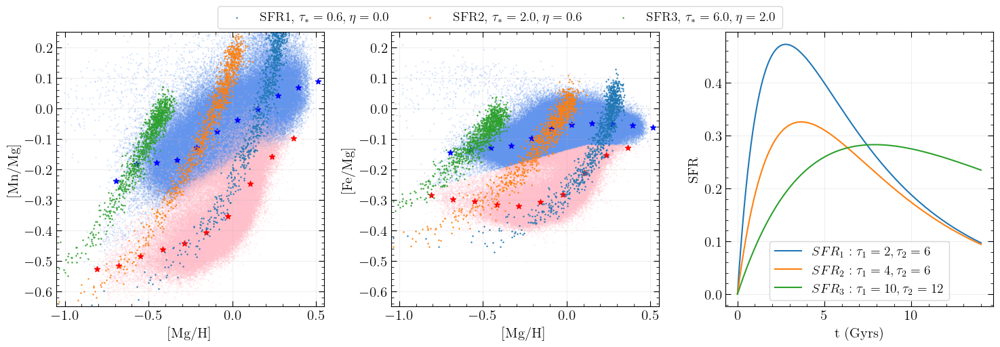

In [11]:
tau_1s = [2, 4, 10]
tau_2s = [6, 6, 12]
sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])

tau_stars_2024 = [0.6, 2.0, 6.0]
etas_2024 = [0, 0.6, 2.0]

gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

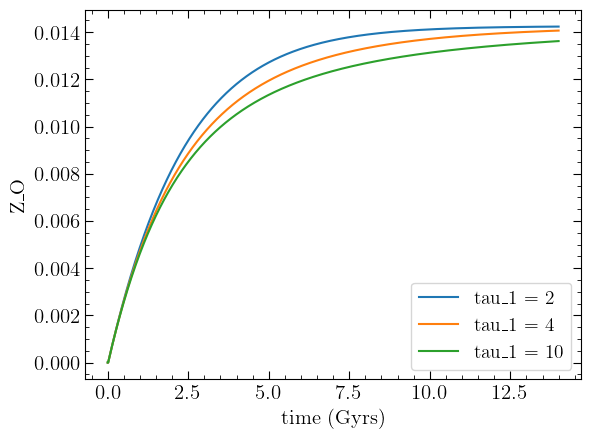

In [12]:
tau_1s = [2, 4, 10]
tau_2s = [6, 6, 12]
sfr_egs = []
for tau_1 in tau_1s:
    sfr_egs.append(rise_fall(t_array, tau_1, tau_2s[0]))

for i in range(len(tau_1s)):
    gal_eg = evo.Galaxy(t_array=t_array, m_g_array=sfr_egs[i], tau_star=tau_stars_2024[0], eta = etas_2024[0])
    plt.plot(gal_eg.t, gal_eg.compute_z_O(), label = f'tau_1 = {tau_1s[i]}')

plt.xlabel('time (Gyrs)')
plt.ylabel('Z_O')
plt.legend()

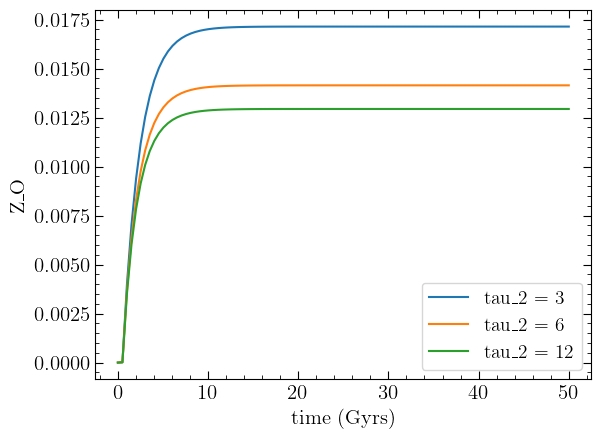

In [13]:
t_array_long = np.linspace(0.001,50,100)

tau_1s = [2, 4, 10]
tau_2s = [3, 6, 12]
sfr_egs = []
for tau_2 in tau_2s:
    sfr_egs.append(rise_fall(t_array_long, tau_1s[0], tau_2))

for i in range(len(tau_1s)):
    gal_eg = evo.Galaxy(t_array=t_array_long, m_g_array=sfr_egs[i], tau_star=tau_stars_2024[0], eta = etas_2024[0])
    plt.plot(gal_eg.t, gal_eg.compute_z_O(), label = f'tau_2 = {tau_2s[i]}')

plt.xlabel('time (Gyrs)')
plt.ylabel('Z_O')
plt.legend()

# SFR1, Tau1

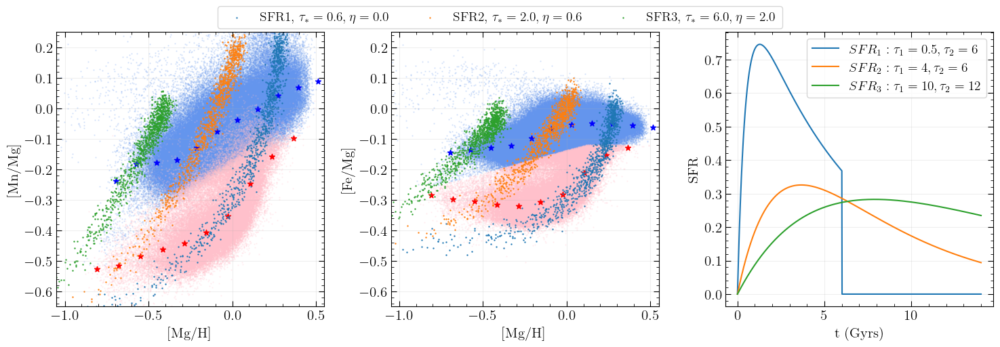

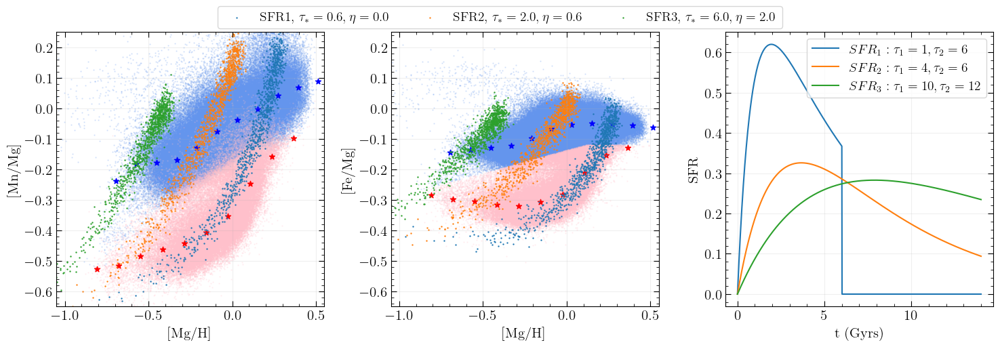

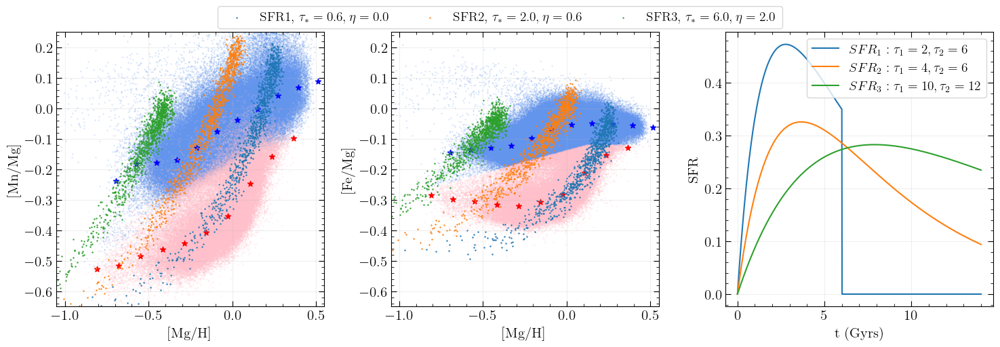

In [14]:
tau_stars_2024 = [0.6, 2.0, 6.0]
etas_2024 = [0, 0.6, 2.0]

options = [0.5,1,2]
for i in range(len(options)):
    tau_1s = [options[i], 4, 10]
    tau_2s = [6, 6, 12]
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
    mask_1 = t_array > 6
    sfr_1[mask_1] = 1e-10

    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

    make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# SFR1, Tau2

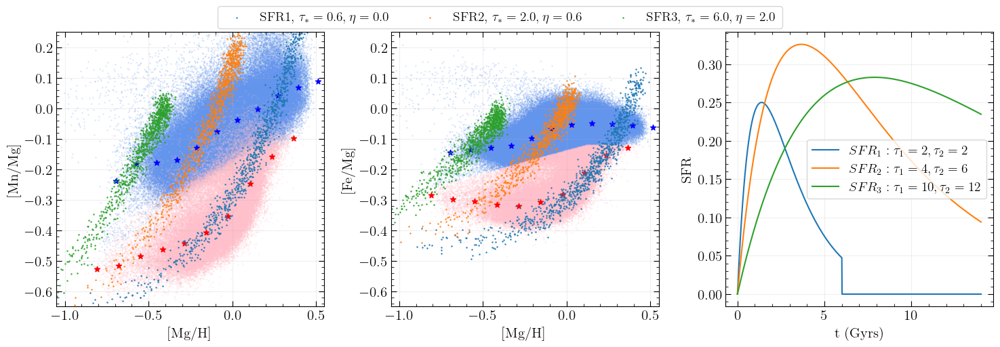

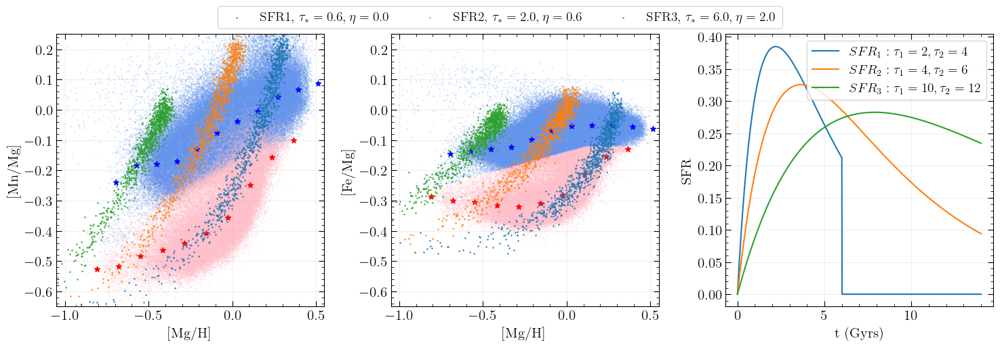

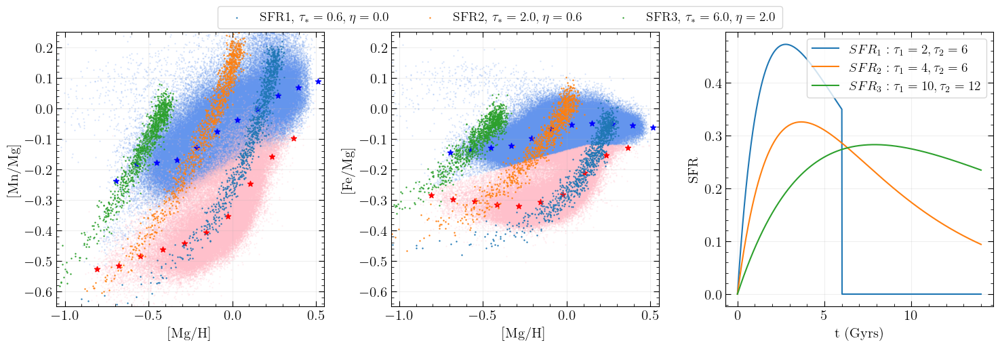

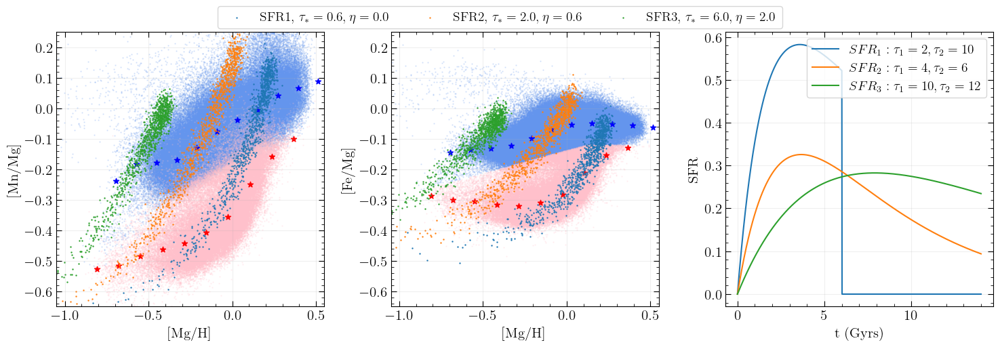

In [15]:
tau_stars_2024 = [0.6, 2.0, 6.0]
etas_2024 = [0, 0.6, 2.0]

options = [2,4,6,10]
for i in range(len(options)):
    tau_1s = [2, 4, 10]
    tau_2s = [options[i], 6, 12]
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
    mask_1 = t_array > 6
    sfr_1[mask_1] = 1e-10

    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

    make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# SFR2, tau1

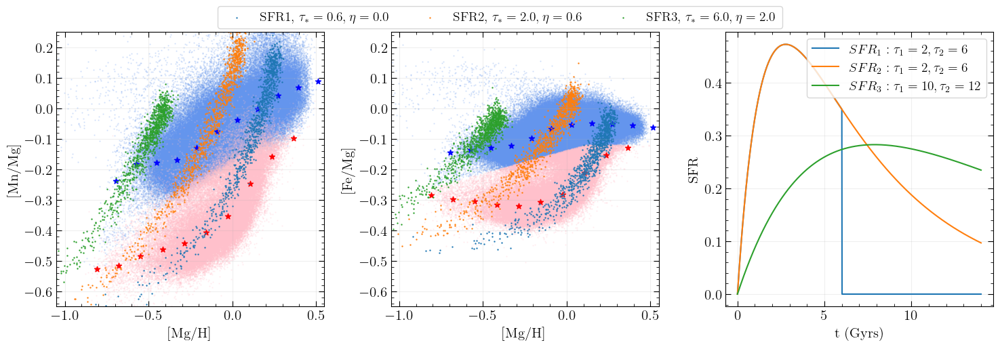

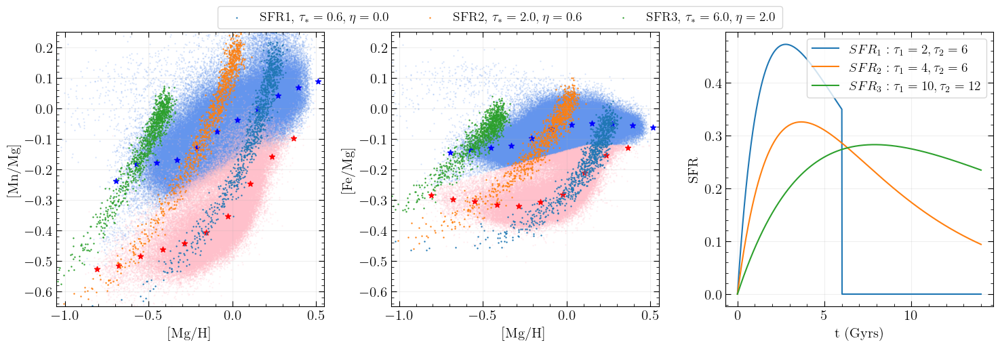

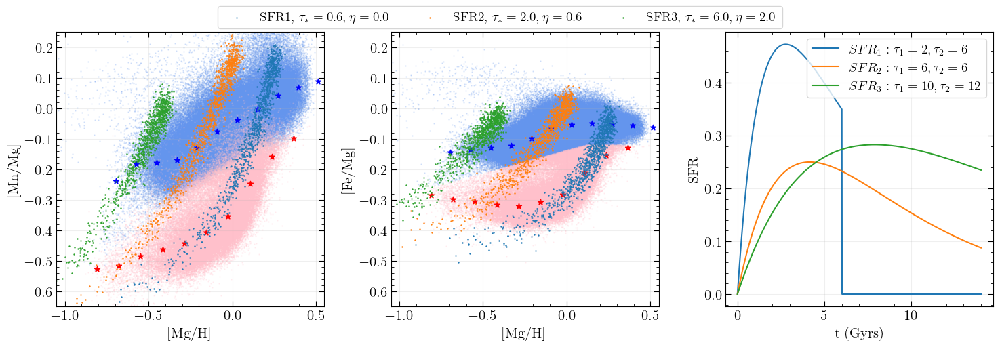

In [30]:
tau_stars_2024 = [0.6, 2.0, 6.0]
etas_2024 = [0, 0.6, 2.0]

options = [2, 4, 6]
for i in range(len(options)):
    tau_1s = [2, options[i], 10]
    tau_2s = [6, 6, 12]
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
    mask_1 = t_array > 6
    sfr_1[mask_1] = 1e-10

    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

    make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# SFR2, tau2

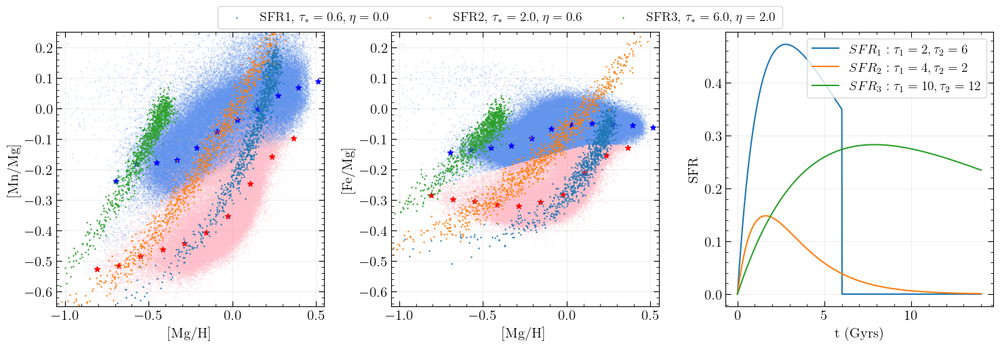

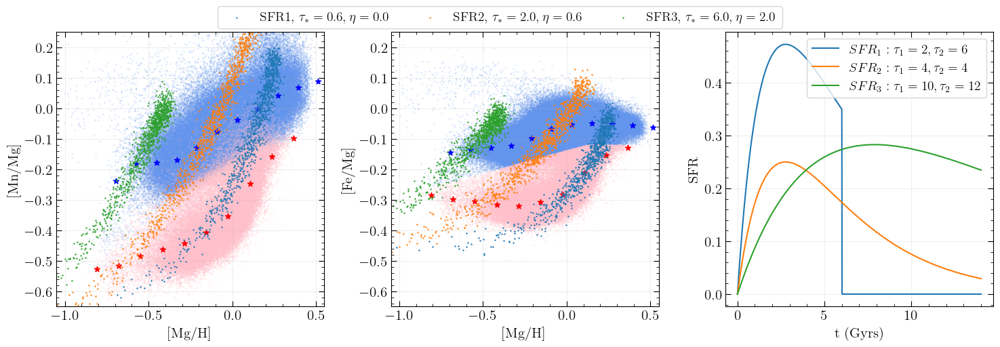

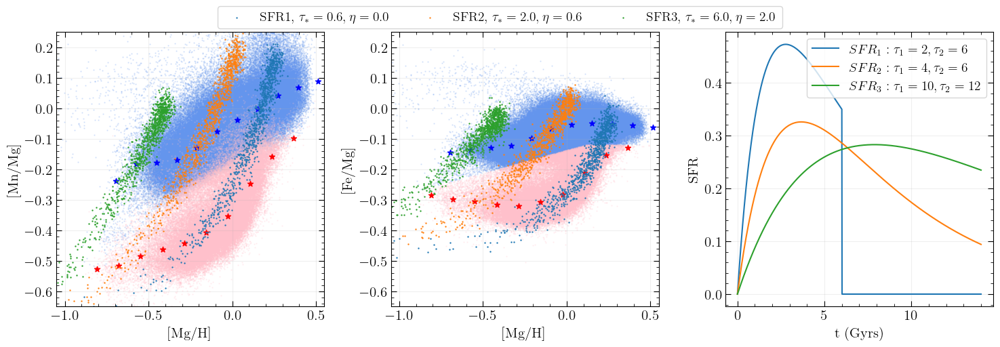

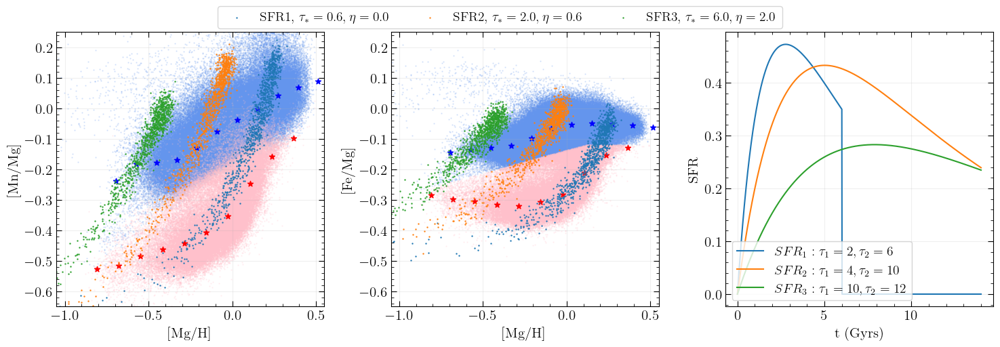

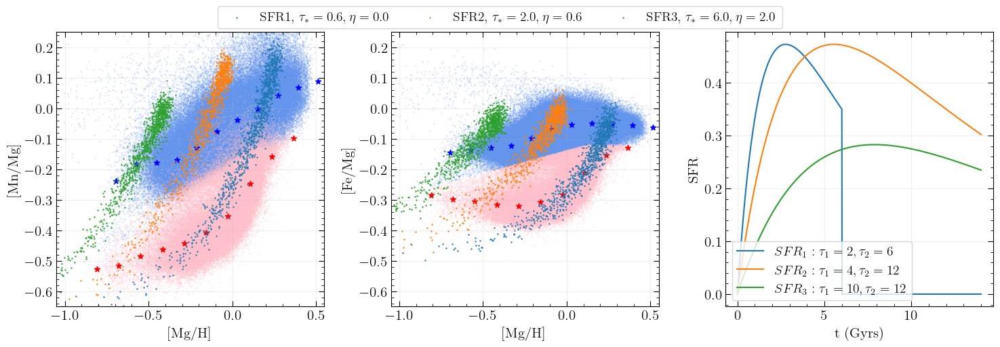

In [32]:
tau_stars_2024 = [0.6, 2.0, 6.0]
etas_2024 = [0, 0.6, 2.0]

options = [2,4,6,10,12]
for i in range(len(options)):
    tau_1s = [2, 4, 10]
    tau_2s = [6, options[i], 12]
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
    mask_1 = t_array > 6
    sfr_1[mask_1] = 1e-10

    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

    make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# SFR3, tau1

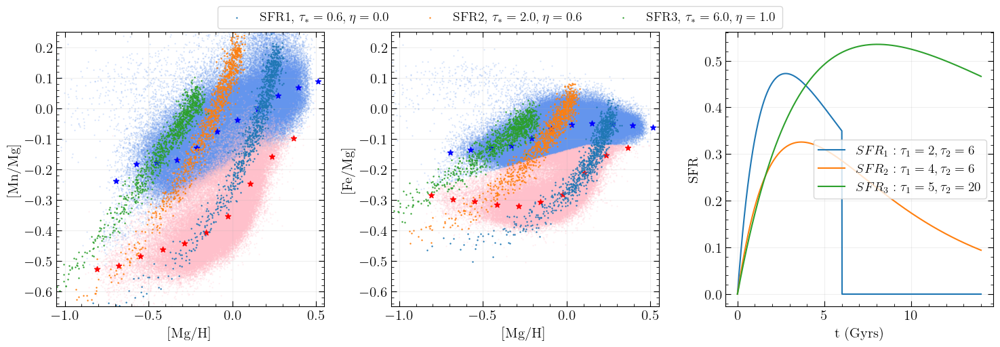

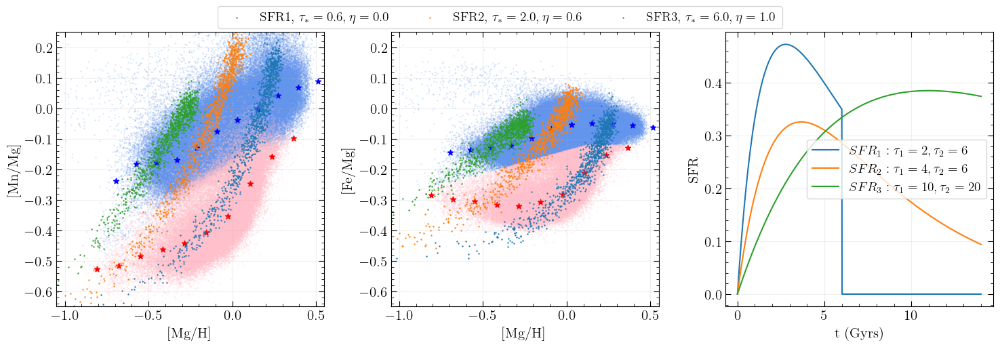

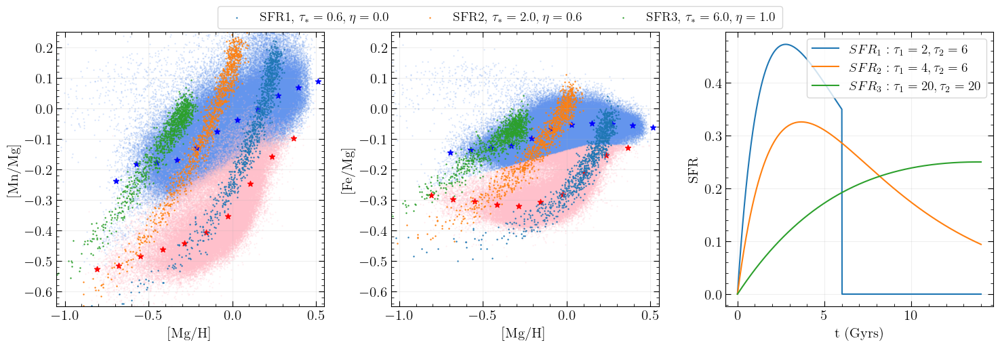

In [17]:
tau_stars_2024 = [0.6, 2.0, 6.0]
etas_2024 = [0, 0.6, 1.0]

options = [5,10,20]
for i in range(len(options)):
    tau_1s = [2, 4, options[i]]
    tau_2s = [6, 6, 20]
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
    mask_1 = t_array > 6
    sfr_1[mask_1] = 1e-10

    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

    make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# tau* and eta at default, changing SFR params to best found

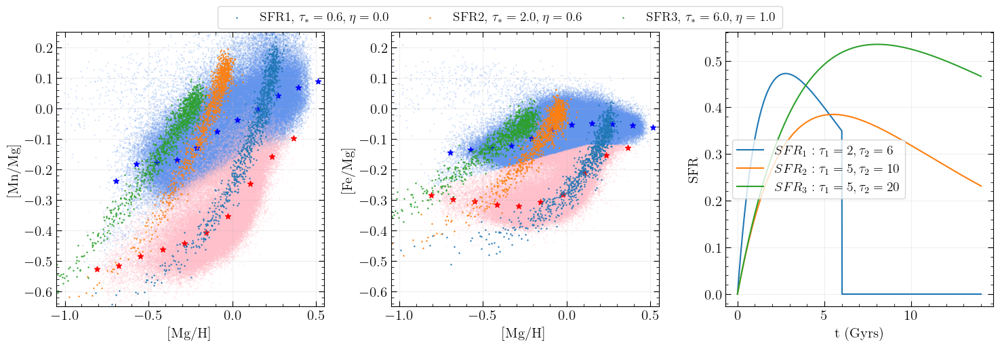

In [35]:
tau_stars_2024 = [0.6, 2.0, 6.0]
etas_2024 = [0, 0.6, 1.0]

tau_1s = [2, 5, 5]
tau_2s = [6, 10, 20]
sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
mask_1 = t_array > 6
sfr_1[mask_1] = 1e-10

gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

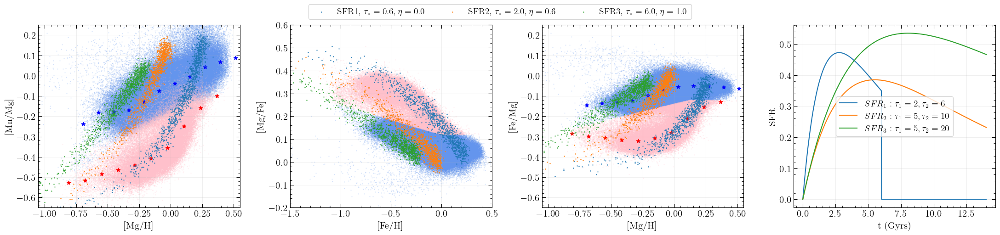

In [36]:
make_four_plots(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# SFR params at default, changing tau* and eta

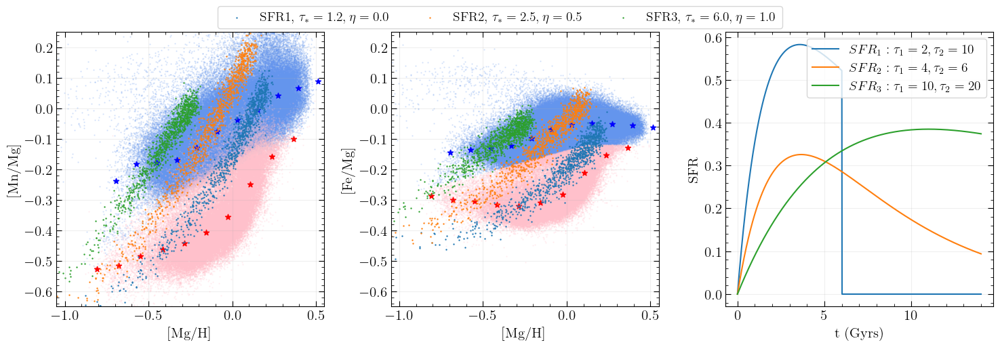

In [37]:
#tau_stars_2024 = [0.6, 2.0, 6.0]
tau_stars_2024 = [1.2, 2.5, 6.0]
etas_2024 = [0, 0.5, 1.0]

tau_1s = [2, 4, 10]
tau_2s = [10, 6, 20]
sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
mask_1 = t_array > 6
sfr_1[mask_1] = 1e-10

gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

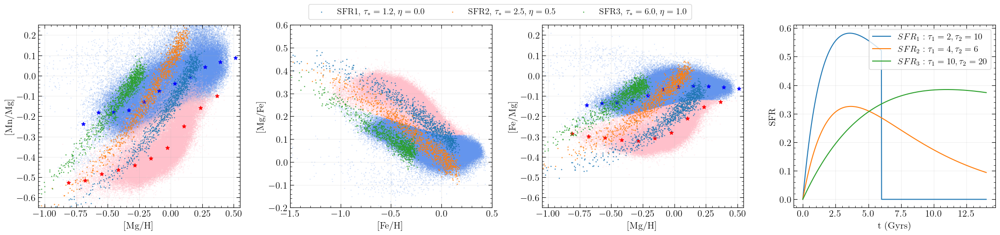

In [38]:
make_four_plots(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# Combine best found values

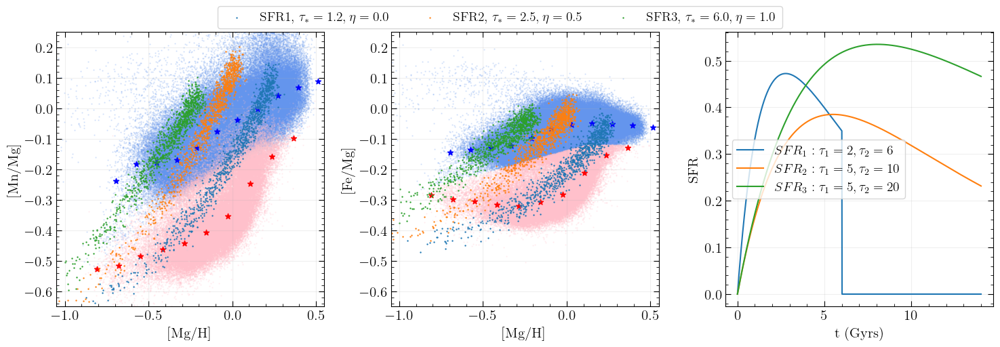

In [39]:
#tau_stars_2024 = [0.6, 2.0, 6.0]
tau_stars_2024 = [1.2, 2.5, 6.0]
etas_2024 = [0, 0.5, 1.0]
tau_1s = [2, 5, 5]
tau_2s = [6, 10, 20]
sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])
mask_1 = t_array > 6
sfr_1[mask_1] = 1e-10

gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1, tau_star=tau_stars_2024[0], eta = etas_2024[0])
gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2, tau_star=tau_stars_2024[1], eta = etas_2024[1])
gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3, tau_star=tau_stars_2024[2], eta = etas_2024[2])

make_triple_plot(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

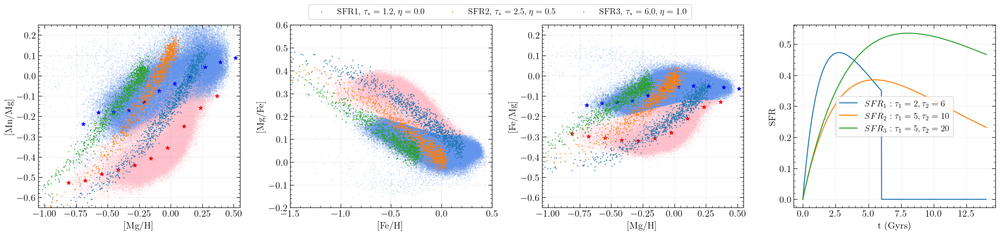

In [40]:
make_four_plots(gal1_rf, gal2_rf, gal3_rf, sfr_1, sfr_2, sfr_3, tau_1s, tau_2s)

# Animations

In [21]:
def make_animation_plot(galaxy1, galaxy2, galaxy3, sfr1, sfr2, sfr3, tau1s, tau2s):
    galaxy1_df = make_mock_pop(galaxy1, sfr1)
    galaxy2_df = make_mock_pop(galaxy2, sfr2)
    galaxy3_df = make_mock_pop(galaxy3, sfr3)

    # IMPORTANT: use existing figure supplied by animation
    fig = plt.gcf()

    # --- subplot 1 ----
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.scatter(data_low_alpha['MG_H'], data_low_alpha['MN_MG'],
                alpha=0.2, color='cornflowerblue', s=0.5)
    ax1.scatter(data_high_alpha['MG_H'], data_high_alpha['MN_MG'],
                alpha=0.2, color='pink', s=0.5)

    ax1.scatter(mnmg_low['x_center'], mnmg_low['MN_MG_median'],
                marker='*', color='blue')
    ax1.scatter(mnmg_high['x_center'], mnmg_high['MN_MG_median'],
                marker='*', color='red')

    ax1.scatter(galaxy1_df['O_H'], galaxy1_df['Mn_O'], s=0.5,
                label=rf'SFR1, $\tau_* = {galaxy1.tau_star_arr[0]} , \eta = {galaxy1.eta_arr[0]}$')
    ax1.scatter(galaxy2_df['O_H'], galaxy2_df['Mn_O'], s=0.5,
                label=rf'SFR2, $\tau_* = {galaxy2.tau_star_arr[0]} , \eta = {galaxy2.eta_arr[0]}$')
    ax1.scatter(galaxy3_df['O_H'], galaxy3_df['Mn_O'], s=0.5,
                label=rf'SFR3, $\tau_* = {galaxy3.tau_star_arr[0]} , \eta = {galaxy3.eta_arr[0]}$')

    ax1.grid(True, alpha=0.2)
    ax1.set_ylim(-0.65, 0.25)
    ax1.set_xlim(-1.05, 0.55)
    ax1.set_xlabel('[Mg/H]')
    ax1.set_ylabel('[Mn/Mg]')

    # --- subplot 2 ----
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.scatter(data_low_alpha['MG_H'], data_low_alpha['FE_MG'],
                alpha=0.2, color='cornflowerblue', s=0.5)
    ax2.scatter(data_high_alpha['MG_H'], data_high_alpha['FE_MG'],
                alpha=0.2, color='pink', s=0.5)

    ax2.scatter(femg_low['x_center'], femg_low['FE_MG_median'],
                marker='*', color='blue')
    ax2.scatter(femg_high['x_center'], femg_high['FE_MG_median'],
                marker='*', color='red')

    ax2.scatter(galaxy1_df['O_H'], galaxy1_df['Fe_O'], s=0.5)
    ax2.scatter(galaxy2_df['O_H'], galaxy2_df['Fe_O'], s=0.5)
    ax2.scatter(galaxy3_df['O_H'], galaxy3_df['Fe_O'], s=0.5)

    ax2.grid(True, alpha=0.2)
    ax2.set_ylim(-0.65, 0.25)
    ax2.set_xlim(-1.05, 0.55)
    ax2.set_xlabel('[Mg/H]')
    ax2.set_ylabel('[Fe/Mg]')

    # --- subplot 3 ----
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.plot(t_array, sfr1,
             label=rf'$SFR_1 : \tau_1 = {tau1s[0]}, \tau_2 = {tau2s[0]}$')
    ax3.plot(t_array, sfr2,
             label=rf'$SFR_2 : \tau_1 = {tau1s[1]}, \tau_2 = {tau2s[1]}$')
    ax3.plot(t_array, sfr3,
             label=rf'$SFR_3 : \tau_1 = {tau1s[2]}, \tau_2 = {tau2s[2]}$')

    ax3.grid(True, alpha=0.2)
    ax3.legend()
    ax3.set_xlabel('t (Gyrs)')
    ax3.set_ylabel('SFR')

    # Figure-level legend for subplot 1
    #fig.legend(loc="upper center", bbox_to_anchor=(0.5, 1.03), ncol=3)

    fig.tight_layout()


In [22]:
from matplotlib.animation import FuncAnimation, FFMpegWriter

options_tau1_sfr1 = [0.5, 1, 2]
options_tau2_sfr1 = [2,4,6,10]
options_tau2_sfr2 = [2,4,6,10]
options_tau1_sfr3 = [5,10,20]


fig = plt.figure(figsize=(15,5))

def animate(frame_idx):
    plt.clf()
    tau_1 = options[frame_idx]
    tau_1s = [tau_1, 4, 10]
    tau_2s = [6, 6, 12]

    # recompute SFR curves
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])

    mask_1 = t_array > 6
    sfr_1[mask_1] = 1e-10

    # build galaxies
    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1,
                         tau_star=tau_stars_2024[0], eta=etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2,
                         tau_star=tau_stars_2024[1], eta=etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3,
                         tau_star=tau_stars_2024[2], eta=etas_2024[2])

    # call your existing plotting function
    make_animation_plot(gal1_rf, gal2_rf, gal3_rf,
                     sfr_1, sfr_2, sfr_3,
                     tau_1s, tau_2s)

    # annotate the frame's τ₁ value
    plt.annotate(
        rf"$\tau_1 = {tau_1}$",
        (0.5, 1.08),
        xycoords="figure fraction",
        ha="center",
        fontsize=16,
        color="black"
    )

animation = FuncAnimation(
    fig,
    animate,
    frames=len(options),
    interval=1500,   # milliseconds per frame
    repeat=True
)

# --- show animation in notebook
#plt.close(fig)  # prevents double display in some environments

animation.save(
    "triple_animation.gif",
    writer=PillowWriter(fps=1)
)

plt.close(fig)


In [23]:
from matplotlib.animation import FuncAnimation, PillowWriter
import matplotlib.pyplot as plt
import numpy as np

# --- parameter options ---
options_tau1_sfr1 = [0.5, 1, 2]
options_tau2_sfr1 = [2, 4, 6, 10]
options_tau2_sfr2 = [2, 4, 6, 10]
options_tau1_sfr3 = [5, 10, 20]

# --- generate frames: list of dictionaries with parameters ---
frames_params = []

# 1) Vary tau_1 of sfr1 (keep tau_2 fixed)
tau2_fixed = 6
for tau1 in options_tau1_sfr1:
    frames_params.append({'tau1_sfr1': tau1, 'tau2_sfr1': tau2_fixed})

# 2) Now vary tau_2 of sfr1 (keep tau_1 fixed at 2)
tau1_fixed = 2
for tau2 in options_tau2_sfr1:
    frames_params.append({'tau1_sfr1': tau1_fixed, 'tau2_sfr1': tau2})

# You can add additional loops later to vary tau_2 of sfr2, tau_1 of sfr3, etc.

# --- animation ---
fig = plt.figure(figsize=(15,5))

def animate(frame_idx):
    plt.clf()  # clear the figure for this frame

    params = frames_params[frame_idx]
    tau_1s = [params['tau1_sfr1'], 4, 10]  # sfr1, sfr2, sfr3
    tau_2s = [params['tau2_sfr1'], 6, 12]  # sfr1, sfr2, sfr3

    # recompute SFR curves
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])

    # optional: mask sfr_1 after t>6
    sfr_1[t_array > 6] = 1e-10

    # build galaxy objects
    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1,
                         tau_star=tau_stars_2024[0], eta=etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2,
                         tau_star=tau_stars_2024[1], eta=etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3,
                         tau_star=tau_stars_2024[2], eta=etas_2024[2])

    # call the animation-safe plotting function
    make_animation_plot(gal1_rf, gal2_rf, gal3_rf,
                     sfr_1, sfr_2, sfr_3,
                     tau_1s, tau_2s)

    # annotate which parameter is changing
    plt.annotate(
        rf"$\tau_1 = {tau_1s[0]}, \tau_2 = {tau_2s[0]}$",
        (0.5, 1.08),
        xycoords="figure fraction",
        ha="center",
        fontsize=16,
        color="black"
    )

# --- create animation ---
animation = FuncAnimation(
    fig,
    animate,
    frames=len(frames_params),
    interval=1500,   # ms per frame
    repeat=True
)

# --- save as GIF ---
animation.save("triple_animation_sfr1.gif", writer=PillowWriter(fps=1))
plt.close(fig)


In [24]:
# --- parameter options for sfr2 ---
options_tau2_sfr2 = [2, 4, 6, 10]  # varying tau_2 of sfr2
tau1s_default = [2, 4, 10]
tau2s_default = [6, 6, 12]

# --- generate frames for sfr2 ---
frames_params_sfr2 = []
for tau2 in options_tau2_sfr2:
    frames_params_sfr2.append({
        'tau1_sfr1': tau1s_default[0],  # keep sfr1 default
        'tau2_sfr1': tau2s_default[0],  # keep sfr1 default
        'tau1_sfr2': tau1s_default[1],  # keep sfr2 tau1 default
        'tau2_sfr2': tau2,              # vary tau2
        'tau1_sfr3': tau1s_default[2],  # sfr3 default
        'tau2_sfr3': tau2s_default[2]   # sfr3 default
    })

# --- animation ---
fig = plt.figure(figsize=(15,5))

def animate_sfr2(frame_idx):
    plt.clf()  # clear the figure for this frame

    params = frames_params_sfr2[frame_idx]

    tau_1s = [params['tau1_sfr1'], params['tau1_sfr2'], params['tau1_sfr3']]
    tau_2s = [params['tau2_sfr1'], params['tau2_sfr2'], params['tau2_sfr3']]

    # recompute SFR curves
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])

    # optional: mask sfr_1 after t>6 (if needed)
    sfr_1[t_array > 6] = 1e-10

    # build galaxy objects
    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1,
                         tau_star=tau_stars_2024[0], eta=etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2,
                         tau_star=tau_stars_2024[1], eta=etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3,
                         tau_star=tau_stars_2024[2], eta=etas_2024[2])

    # call the animation-safe plotting function
    make_animation_plot(gal1_rf, gal2_rf, gal3_rf,
                     sfr_1, sfr_2, sfr_3,
                     tau_1s, tau_2s)

    # annotate which parameter is changing
    plt.annotate(
        rf"$\tau_2(\mathrm{{sfr2}}) = {tau_2s[1]}$",
        (0.5, 1.08),
        xycoords="figure fraction",
        ha="center",
        fontsize=16,
        color="black"
    )

# --- create animation ---
animation_sfr2 = FuncAnimation(
    fig,
    animate_sfr2,
    frames=len(frames_params_sfr2),
    interval=1500,   # ms per frame
    repeat=True
)

# --- save as GIF ---
animation_sfr2.save("triple_animation_sfr2.gif", writer=PillowWriter(fps=1))
plt.close(fig)


In [25]:
# --- parameter options for sfr3 ---
options_tau1_sfr3 = [5, 10, 20]  # varying tau_1 of sfr3
tau1s_default = [2, 4, 10]
tau2s_default = [6, 6, 12]

# --- generate frames for sfr3 ---
frames_params_sfr3 = []
for tau1 in options_tau1_sfr3:
    frames_params_sfr3.append({
        'tau1_sfr1': tau1s_default[0],  # sfr1 default
        'tau2_sfr1': tau2s_default[0],  # sfr1 default
        'tau1_sfr2': tau1s_default[1],  # sfr2 default
        'tau2_sfr2': tau2s_default[1],  # sfr2 default
        'tau1_sfr3': tau1,               # vary tau1 of sfr3
        'tau2_sfr3': tau2s_default[2]    # sfr3 default
    })

# --- animation ---
fig = plt.figure(figsize=(15,5))

def animate_sfr3(frame_idx):
    plt.clf()  # clear the figure for this frame

    params = frames_params_sfr3[frame_idx]

    tau_1s = [params['tau1_sfr1'], params['tau1_sfr2'], params['tau1_sfr3']]
    tau_2s = [params['tau2_sfr1'], params['tau2_sfr2'], params['tau2_sfr3']]

    # recompute SFR curves
    sfr_1 = rise_fall(t_array, tau_1s[0], tau_2s[0])
    sfr_2 = rise_fall(t_array, tau_1s[1], tau_2s[1])
    sfr_3 = rise_fall(t_array, tau_1s[2], tau_2s[2])

    # optional: mask sfr_1 after t>6
    sfr_1[t_array > 6] = 1e-10

    # build galaxy objects
    gal1_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_1,
                         tau_star=tau_stars_2024[0], eta=etas_2024[0])
    gal2_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_2,
                         tau_star=tau_stars_2024[1], eta=etas_2024[1])
    gal3_rf = evo.Galaxy(t_array=t_array, m_g_array=sfr_3,
                         tau_star=tau_stars_2024[2], eta=etas_2024[2])

    # call the animation-safe plotting function
    make_animation_plot(gal1_rf, gal2_rf, gal3_rf,
                        sfr_1, sfr_2, sfr_3,
                        tau_1s, tau_2s)

    # annotate which parameter is changing
    plt.annotate(
        rf"$\tau_1(\mathrm{{sfr3}}) = {tau_1s[2]}$",
        (0.5, 1.08),
        xycoords="figure fraction",
        ha="center",
        fontsize=16,
        color="black"
    )

# --- create animation ---
animation_sfr3 = FuncAnimation(
    fig,
    animate_sfr3,
    frames=len(frames_params_sfr3),
    interval=1500,   # ms per frame
    repeat=True
)

# --- save as GIF ---
animation_sfr3.save("triple_animation_sfr3.gif", writer=PillowWriter(fps=1))
plt.close(fig)
